In [239]:
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as skl
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline
import random

7


In [290]:
dados = pd.read_csv("D:\SI-IA2021\EP1\creditcard.csv")
dados.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [291]:
dados.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

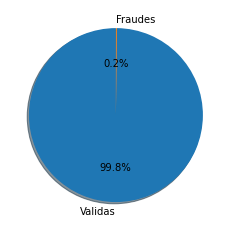

In [292]:
v = dados["Class"].count()-dados["Class"].sum()
f = dados["Class"].sum()

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Validas', 'Fraudes'
sizes = [v, f,]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)

plt.show()


In [299]:
valido = dados.loc[dados["Class"]==0]
fraude = dados.loc[dados["Class"]==1]
r = random.randint(0, dados["Class"].count())
print(r)
conc = valido.loc[r-2:r]
for l in range(0,f):
    r = random.randint(0, dados["Class"].count())
    aux = valido.loc[r-random.randint(0,5):r]
    conc = pd.concat([conc, aux])
conc

206811


,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
206809,136382.0,-0.897621,-1.124184,1.325381,-1.605616,-1.243825,-0.667726,-1.371131,0.600811,-0.041577,...,0.101194,0.440778,0.241147,0.005167,-1.383669,0.820924,0.114089,0.047807,51.00,0
206810,136382.0,-0.445502,0.837851,1.317365,0.845505,0.390697,-0.004134,0.965630,-0.005521,0.051666,...,-0.259538,-0.448937,-0.171995,-0.107021,0.168364,-0.721262,0.159130,0.135637,30.00,0
206811,136383.0,-1.845526,0.585559,0.566705,-1.378307,0.042462,-0.405279,-0.221800,1.016168,0.257581,...,-0.018393,-0.527250,0.108223,0.327027,-0.055278,-0.802191,-0.219805,-0.152851,1.18,0
159243,112378.0,2.053987,-0.178705,-1.604501,-0.012460,0.360607,-0.335874,-0.037114,-0.034019,0.687583,...,0.285347,0.886919,-0.022823,0.283845,0.316631,-0.440460,-0.004951,-0.063719,1.00,0
159244,112378.0,0.701646,0.513252,-0.435354,-0.097499,0.312758,-0.466593,0.173794,-0.954902,0.415689,...,1.053955,0.635857,-0.195057,0.666117,0.558789,-0.324692,0.269137,0.302767,1.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251029,155178.0,0.096745,-0.179577,0.733103,1.183772,-0.301498,0.417561,-0.289865,-0.124005,0.634282,...,0.173787,1.159879,0.285331,-0.323129,-0.732390,0.955551,-0.364512,-0.387512,27.05,0
28962,35253.0,-0.698614,-0.442463,0.799023,-1.692232,0.275613,-0.906247,0.342689,-0.197463,-0.803843,...,0.197883,0.856020,0.171949,-0.015090,-0.209491,-0.346736,0.138678,-0.036798,10.00,0
28963,35254.0,1.367175,-0.873617,0.740826,-0.816499,-0.994296,0.594144,-1.249938,0.242364,-0.206595,...,0.102325,0.366326,-0.181955,-0.784903,0.491857,-0.144044,0.048373,0.007759,19.94,0
28964,35255.0,1.093027,0.069188,0.785234,1.205533,-0.698503,-0.537038,-0.203626,0.076301,0.019771,...,-0.006642,-0.165081,0.031710,0.490389,0.307132,-0.508831,0.017401,0.026754,36.00,0


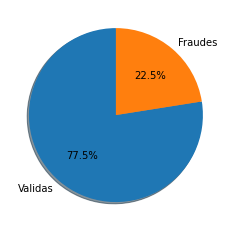

In [300]:
dados_fim = pd.concat([conc, fraude])
v = dados_fim["Class"].count()-dados["Class"].sum()
f = dados_fim["Class"].sum()

# Pie chart, where the slices will be ordered and plotted counter-clockwise:
labels = 'Validas', 'Fraudes'
sizes = [v, f,]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)

plt.show()


[[0.22201371 0.54020654]
 [1.34743875 1.41282352]
 [0.53723817 0.37273043]
 ...
 [1.87813003 0.82950037]
 [2.58593336 1.92799501]
 [1.1233558  1.04575545]] Vinicius
[0 0 0 ... 0 0 0]
Counter({0: 9900, 1: 100})
Counter({0: 9900, 1: 9900})


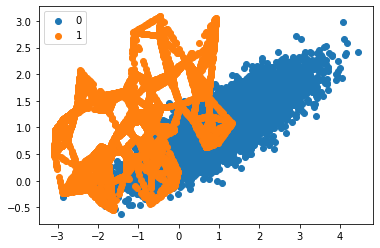

In [218]:
# Oversample and plot imbalanced dataset with SMOTE
from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
from matplotlib import pyplot
from numpy import where
# define dataset
X, y = make_classification(n_samples=10000, n_features=2, n_redundant=0,
	n_clusters_per_class=1, weights=[0.99], flip_y=0, random_state=1)
# summarize class distribution
print(X)
print(y)
counter = Counter(y)
print(counter)
# transform the dataset
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)
# summarize the new class distribution
counter = Counter(y)
print(counter)
# scatter plot of examples by class label
for label, _ in counter.items():
	row_ix = where(y == label)[0]
	pyplot.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
pyplot.legend()
pyplot.show()

492
284315


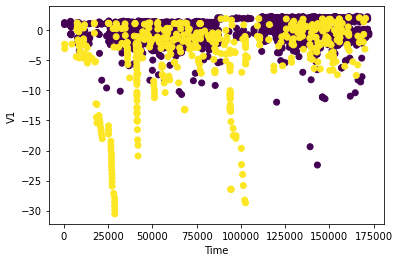

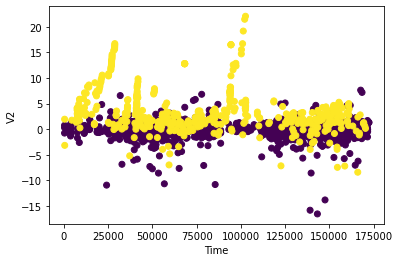

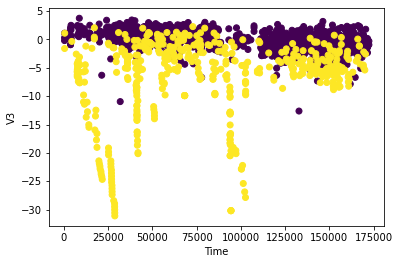

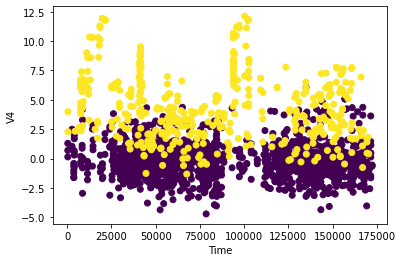

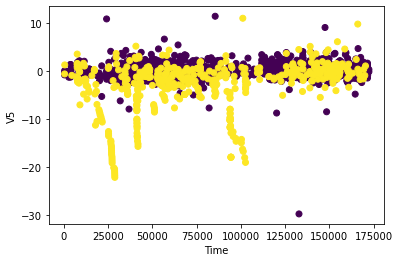

...

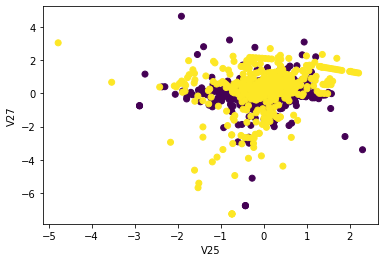

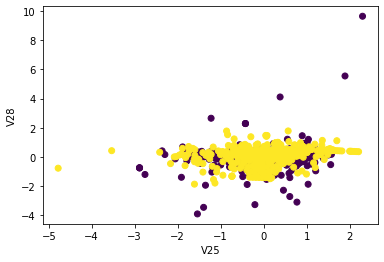

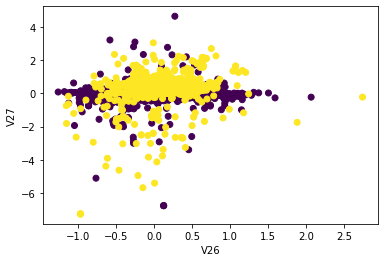

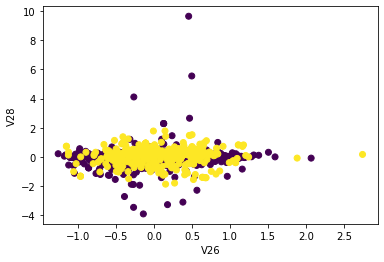

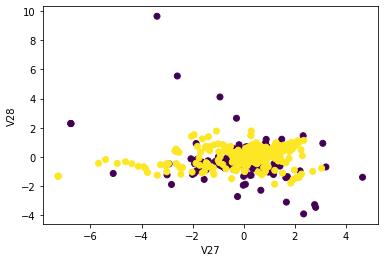

In [306]:
colunas = dados_fim.columns
for i in range(0,28):
    for j in range(i+1,29):
        cor= dados_fim['Class']
        plt.scatter(dados_fim[colunas[i]],dados_fim[colunas[j]],c=cor)
        plt.xlabel(colunas[i])
        plt.ylabel(colunas[j])
        plt.show()

In [112]:
x = "V" + str(1)
print(x)

V1
